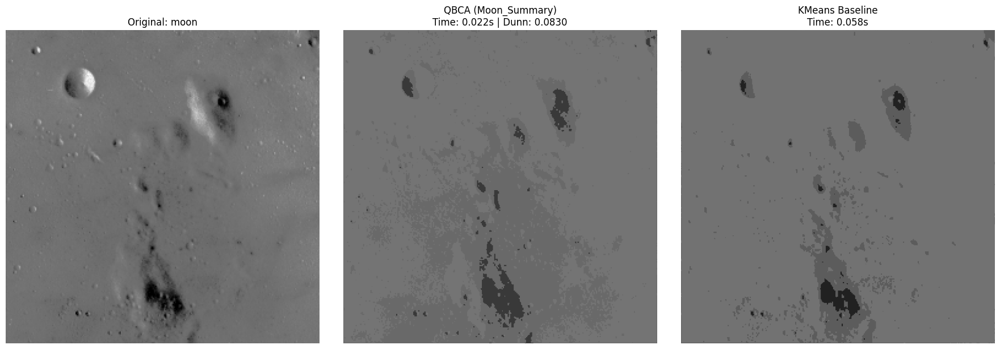

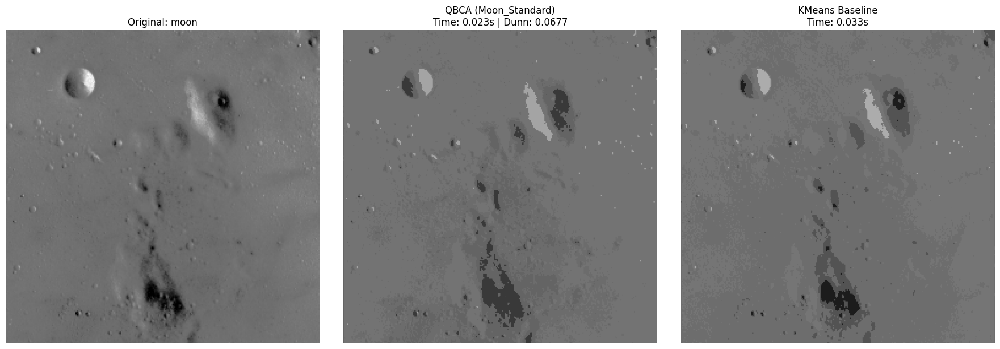

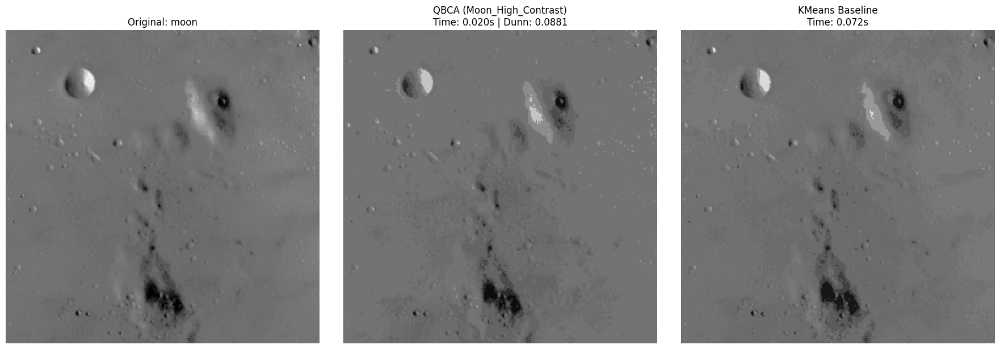

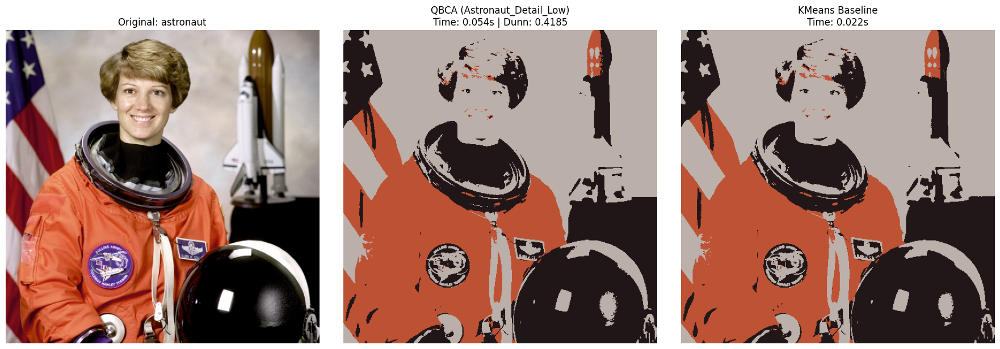

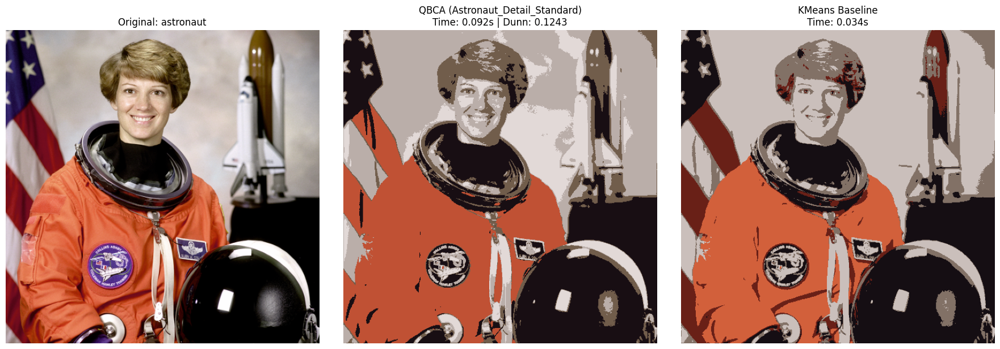

...

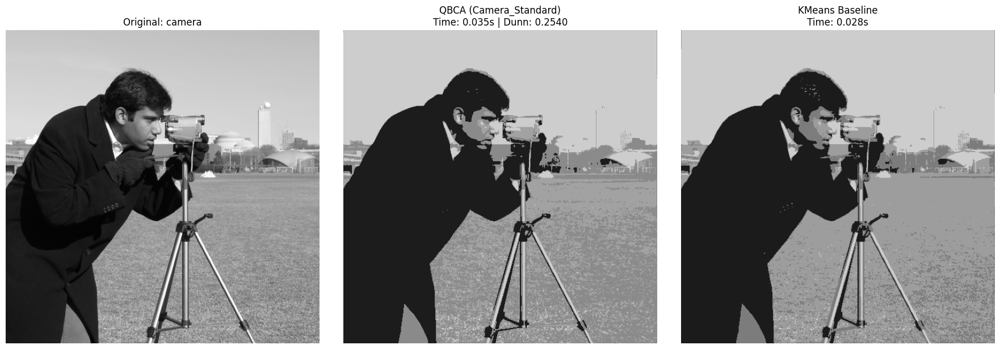

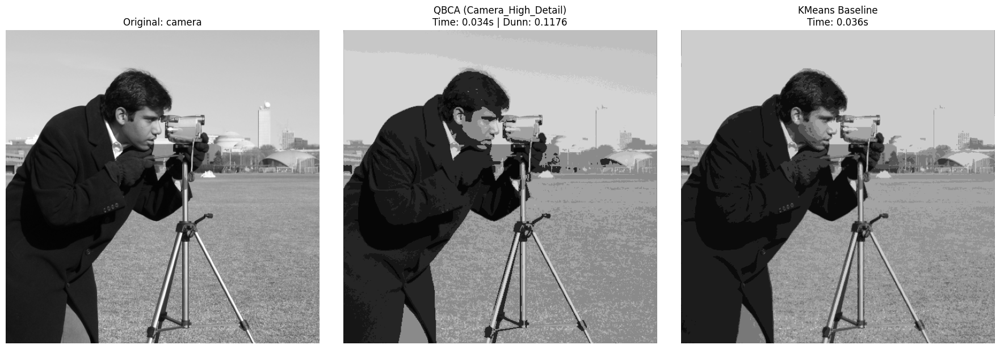

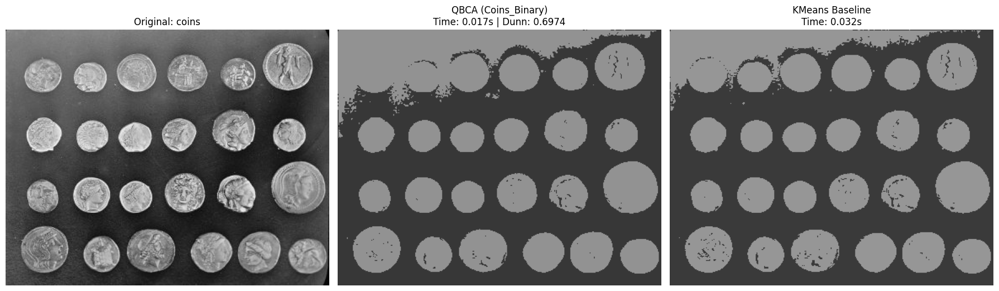

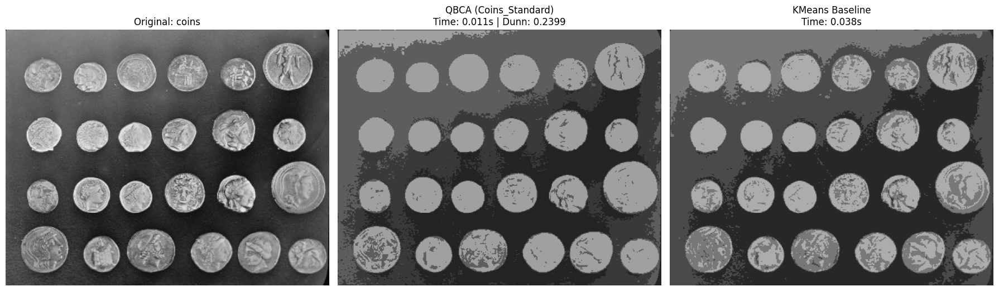

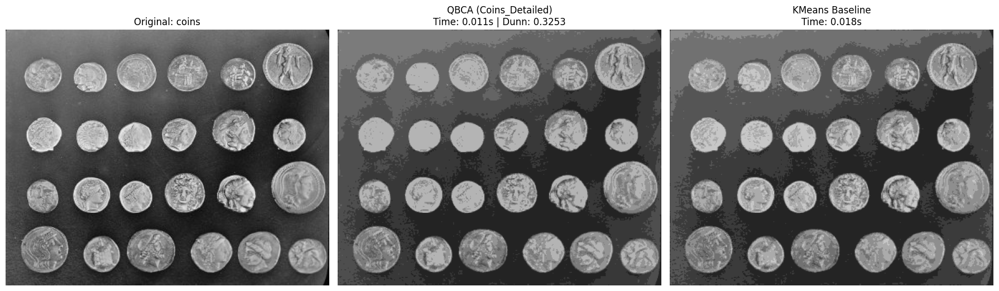

In [1]:
"""QBCA image segmentation baseline analysis."""

import json
import time
from collections import defaultdict
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from skimage import color, data
from scipy.signal import convolve2d

from sklearn.cluster import KMeans

from qbca import QBCA

def get_paper_gaussian_kernel(size=5, sigma=0.5):
    """Create the rotationally symmetric 5x5 kernel."""
    ax = np.linspace(-(size - 1) / 2., (size - 1) / 2., size)
    gauss = np.exp(-0.5 * (ax**2 / sigma**2))
    kernel = np.outer(gauss, gauss)
    return kernel / kernel.sum()

# Pre-calculate the kernel used in the paper
paper_kernel = get_paper_gaussian_kernel(size=5, sigma=0.5)

# Load configs
with open('config/config_segmentation.json', 'r') as f:
    config_data = json.load(f)

grouped = defaultdict(list)
for exp in config_data['experiments']:
    grouped[exp['image_func']].append(exp)

output_dir = Path('images/image_segmentation_vs_baseline')
output_dir.mkdir(parents=True, exist_ok=True)

for img_func_name, exps in grouped.items():
    img_func = getattr(data, img_func_name)
    img = img_func()
    if img.ndim == 2:
        img = color.gray2rgb(img)

    # Original QBCA results against a KMeans baseline
    for cfg in exps:
        # Apply convolution to each RGB channel
        img_smoothed = np.zeros_like(img, dtype=float)
        for i in range(3):
            img_smoothed[:, :, i] = convolve2d(img[:, :, i], paper_kernel, mode='same')

        # Lab Feature Extraction
        img_lab = color.rgb2lab(img_smoothed / 255.0 if img.max() > 1 else img_smoothed)
        pixel_data = img_lab.reshape((-1, 3))

        # QBCA Run
        model = QBCA(k=cfg['k'], threshold=cfg['epsilon'], max_iter=cfg['max_iter'])
        start_qbca = time.time()
        labels_qbca, centers_qbca, _ = model.fit(pixel_data)
        time_qbca = time.time() - start_qbca
        dunn_qbca = model.dunn_index(pixel_data, labels_qbca)

        # KMeans Benchmark (Baseline for efficiency/quality comparison)
        km = KMeans(n_clusters=cfg['k'], n_init=1, max_iter=cfg['max_iter'], tol=cfg['epsilon'])
        start_km = time.time()
        labels_km = km.fit_predict(pixel_data)
        time_km = time.time() - start_km

        # Visualization
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        axes[0].imshow(img)
        axes[0].set_title(f"Original: {img_func_name}")

        # QBCA Result
        seg_qbca = color.lab2rgb(centers_qbca[labels_qbca].reshape(img_lab.shape))
        axes[1].imshow(seg_qbca)
        axes[1].set_title(f"QBCA ({cfg['name']})\nTime: {time_qbca:.3f}s | Dunn: {dunn_qbca:.4f}")

        # KMeans Result
        seg_km = color.lab2rgb(km.cluster_centers_[labels_km].reshape(img_lab.shape))
        axes[2].imshow(seg_km)
        axes[2].set_title(f"KMeans Baseline\nTime: {time_km:.3f}s")

        for ax in axes:
            ax.axis('off')
        plt.tight_layout()

        # Save per-method images for direct inclusion in report_qbca.tex
        plt.imsave(output_dir / f"{cfg['name']}_original.png", img)
        plt.imsave(output_dir / f"{cfg['name']}_qbca.png", np.clip(seg_qbca, 0, 1))
        plt.imsave(output_dir / f"{cfg['name']}_kmeans.png", np.clip(seg_km, 0, 1))

        # Optional combined comparison panel
        output_path = output_dir / f"{cfg['name']}_comparison.png"
        fig.savefig(output_path, dpi=150, bbox_inches='tight')
        plt.show()
        plt.close(fig)